In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

import warnings
warnings.filterwarnings('ignore')

### Steps: - tentative
1. Data understanding 
 - Import the data
 - Checking for null values
 - Checking for summary of the dataset


2. Data Preparation and EDA
 - Remove and irrelavant features
 - Check for skewness in target variable and transform the data if necessary
 - Convert categorical varaibles to numerical variables
 - Split the data to train and test sets
 - Scale the data (transform & fit on train, fit on test) 
 - Plot pair plots and correlation heatmaps for understanding relationships in the data set
     

3. Model building
 - Choosing an appropirate model
     - Multicollinearity checks
 - Test the initial linear regression model
 - Feature Selection / Feature Engineering
     - Variable Transformation
 - Drop insignificant variables
     - Using p-value (The hypothesis test of significance)
     - VIF
     - RFE
 - Iteratively test the model
 - Bais / Variance Trade off
 - Regularization
 - Imporve R2, Adjusted R2, AIC, BIC, F statistic & other metrics


4. Model evaluation
 - Check results on test set

In [95]:
car_data = pd.read_csv("CarPrice_Assignment.csv")

In [96]:
car_data.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


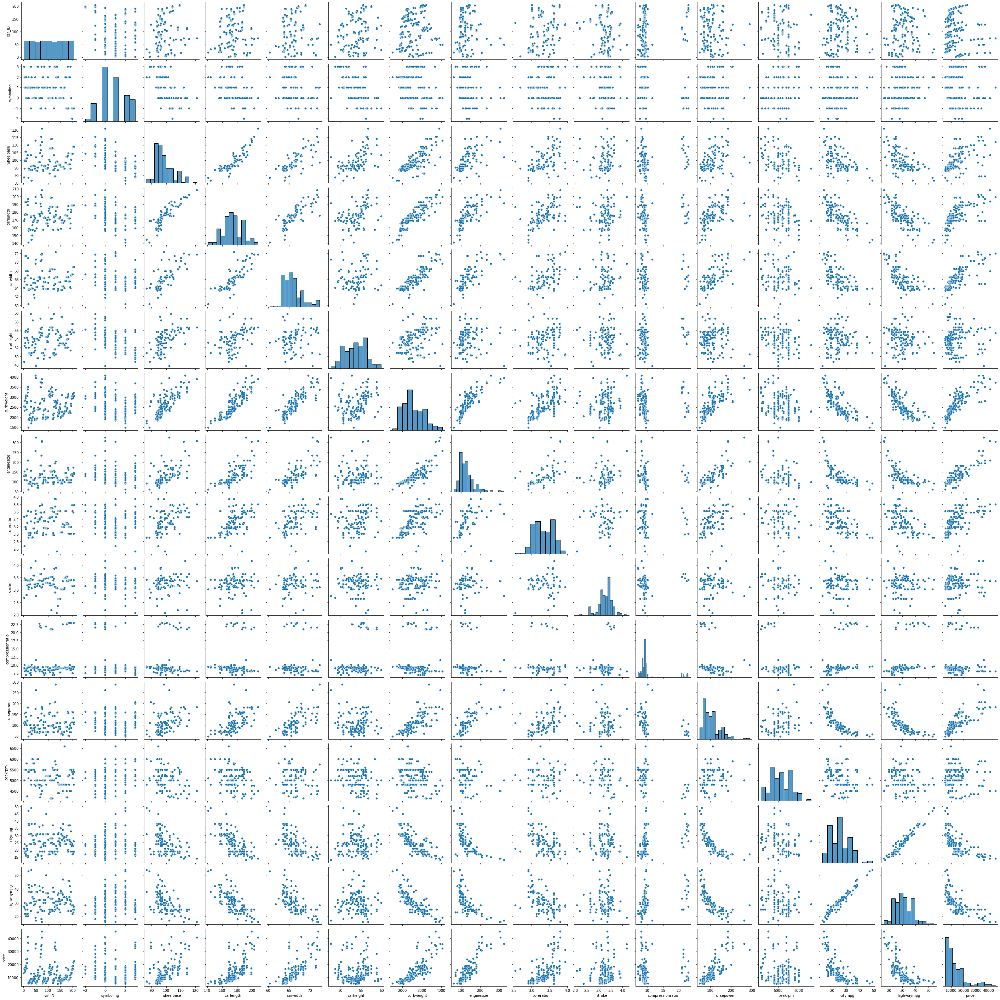

In [97]:
sns.pairplot(car_data)

#### Observations
1. The distribution of prices is not normal and a log transformation could improve the model performance
2. Compresion ration has outliers in the data 
3. There seem to be a lot of correlated variables which might lead to the problem of multicollinearity



#### Step 1. Underding the data

In [57]:
car_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

In [58]:
car_data.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


#### Step 2. Data Preparation and EDA

In [59]:
# Removing unnecessary variables
car_data.drop(['car_ID','CarName'], axis=1, inplace=True)

In [60]:
# Exploring categorical variables
print("Unique values in Fuel Type      :",car_data['fueltype'].unique())
print("Unique values in Aspiration     :",car_data['aspiration'].unique())
print("Unique values in Door Number    :",car_data['doornumber'].unique())
print("Unique values in Door Number    :",car_data['drivewheel'].unique())
print("Unique values in Engine Location:",car_data['enginelocation'].unique())
print("Unique values in Car Body       :",car_data['carbody'].unique())
print("Unique values in Engine Type.   :",car_data['enginetype'].unique())
print("Unique values in Cylinder Number:",car_data['cylindernumber'].unique())
print("Unique values in Fuel System    :",car_data['fuelsystem'].unique())

Unique values in Fuel Type      : ['gas' 'diesel']
Unique values in Aspiration     : ['std' 'turbo']
Unique values in Door Number    : ['two' 'four']
Unique values in Door Number    : ['rwd' 'fwd' '4wd']
Unique values in Engine Location: ['front' 'rear']
Unique values in Car Body       : ['convertible' 'hatchback' 'sedan' 'wagon' 'hardtop']
Unique values in Engine Type.   : ['dohc' 'ohcv' 'ohc' 'l' 'rotor' 'ohcf' 'dohcv']
Unique values in Cylinder Number: ['four' 'six' 'five' 'three' 'twelve' 'two' 'eight']
Unique values in Fuel System    : ['mpfi' '2bbl' 'mfi' '1bbl' 'spfi' '4bbl' 'idi' 'spdi']


In [61]:
# Converting categorical variables to numerical variables
car_data['fueltype'] = car_data['fueltype'].map({'gas': 1, 'diesel': 0})
car_data['aspiration'] = car_data['aspiration'].map({'std': 1, 'turbo': 0})
car_data['doornumber'] = car_data['doornumber'].map({'two': 1, 'four': 0})
car_data['enginelocation'] = car_data['enginelocation'].map({'front': 1, 'rear': 0})
car_data['cylindernumber'] = car_data['cylindernumber'].map({'four': 4, 'six': 6, 'five': 5, 'three': 3, 'twelve': 12, 'two': 2, 'eight': 8})

# Creating dummy variables for features with more than 2 unique values
carbody = pd.get_dummies(car_data['drivewheel'],drop_first=True)
car_data = pd.concat([car_data,carbody],axis=1)
carbody = pd.get_dummies(car_data['carbody'],drop_first=True)
car_data = pd.concat([car_data,carbody],axis=1)
enginetype = pd.get_dummies(car_data['enginetype'],drop_first=True)
car_data = pd.concat([car_data,enginetype],axis=1)
fuelsystem = pd.get_dummies(car_data['fuelsystem'],drop_first=True)
car_data = pd.concat([car_data,fuelsystem],axis=1)

# Droping un-necessary variables
car_data.drop(['carbody','enginetype','fuelsystem','drivewheel'], axis=1, inplace=True)
car_data.head()

,symboling,fueltype,aspiration,doornumber,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,...,ohcf,ohcv,rotor,2bbl,4bbl,idi,mfi,mpfi,spdi,spfi
0,3,1,1,1,1,88.6,168.8,64.1,48.8,2548,...,0,0,0,0,0,0,0,1,0,0
1,3,1,1,1,1,88.6,168.8,64.1,48.8,2548,...,0,0,0,0,0,0,0,1,0,0
2,1,1,1,1,1,94.5,171.2,65.5,52.4,2823,...,0,1,0,0,0,0,0,1,0,0
3,2,1,1,0,1,99.8,176.6,66.2,54.3,2337,...,0,0,0,0,0,0,0,1,0,0
4,2,1,1,0,1,99.4,176.6,66.4,54.3,2824,...,0,0,0,0,0,0,0,1,0,0


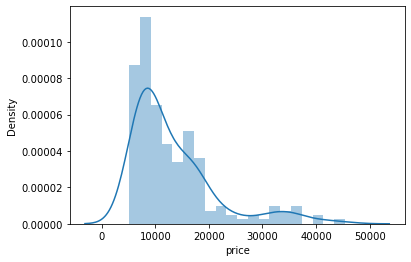

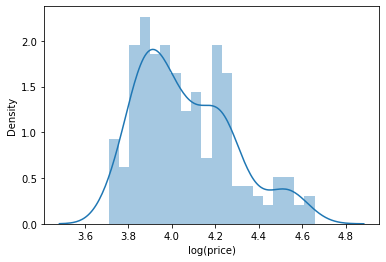

In [62]:
# checking the distribution of the target variable
sns.distplot(car_data['price'], bins = 20)

# The data is right skewed and might require a log distribution of better prediction
# log tranformation (adding 1 to car price value to avoid log(0) error)
car_data['log(price)'] = np.log10(car_data['price']+1)
fig = plt.figure()
sns.distplot(car_data['log(price)'], bins = 20)

# Dropping price column
car_data.drop(['price'], axis=1, inplace=True)

In [63]:
plt.figure(figsize = (40,10),dpi=500)
sns.heatmap(car_data.corr(),annot=True)

<AxesSubplot:>

In [64]:
car_data.columns

Index(['symboling', 'fueltype', 'aspiration', 'doornumber', 'enginelocation',
       'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight',
       'cylindernumber', 'enginesize', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'fwd', 'rwd', 'hardtop', 'hatchback', 'sedan', 'wagon', 'dohcv', 'l',
       'ohc', 'ohcf', 'ohcv', 'rotor', '2bbl', '4bbl', 'idi', 'mfi', 'mpfi',
       'spdi', 'spfi', 'log(price)'],
      dtype='object')

In [65]:
# Splitting the data to test and train set
car_train_data, car_test_data = train_test_split(car_data,train_size=0.7,random_state=123)

# Creating Standard Scaler object
scaler = StandardScaler()

#Fitting and transform the train set
scaled_features_train = scaler.fit_transform(car_train_data)
car_train_data_scaled = pd.DataFrame(scaled_features_train, 
                                      index=car_train_data.index, 
                                      columns=car_train_data.columns)

#Transforming the train set
scaled_features_test = scaler.transform(car_test_data)
car_test_data_scaled = pd.DataFrame(scaled_features_test, 
                                     index=car_test_data.index, 
                                     columns=car_test_data.columns)

### Model Building

#### Conditions for dropping features

 Use P-value and VIF (Variance Inflation factor to iteratively select/drop variables) 

1. Drop - High VIF & High P-value
2. Keep - Low VIF & Low P-value
3. If VIF or P-Value is high, remove variables with high p-value first and then check VIF of the remaining variables

This needs to be done until all features are significant, and maintain a good R-Squared value

In [66]:
features = ['symboling', 'fueltype', 'aspiration', 'doornumber', 'enginelocation',
       'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight',
       'cylindernumber', 'enginesize', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'fwd', 'rwd', 'hardtop', 'hatchback', 'sedan', 'wagon', 'dohcv', 'l',
       'ohc', 'ohcf', 'ohcv', 'rotor', '2bbl', '4bbl', 'idi', 'mfi', 'mpfi',
       'spdi', 'spfi']

y_train = car_train_data_scaled['log(price)']
X_train = car_train_data_scaled[features]
y_test = car_test_data_scaled['log(price)']
X_test = car_test_data_scaled[features]

In [67]:
# Adding a constant column
X_train_lm = sm.add_constant(X_train)
X_test_lm = sm.add_constant(X_test)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_lm).fit()

print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:             log(price)   R-squared:                       0.935
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     40.66
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           2.47e-47
Time:                        02:47:27   Log-Likelihood:                -7.7322
No. Observations:                 143   AIC:                             91.46
Df Residuals:                     105   BIC:                             204.1
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -4.555e-15      0.025  

In [68]:
# Calculating VIF of all variables
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
33,idi,inf
1,fueltype,inf
14,compressionratio,137.08
18,highwaympg,62.78
17,citympg,59.44
11,enginesize,49.11
9,curbweight,34.68
15,horsepower,32.56
10,cylindernumber,25.74
20,rwd,18.39


#### Iteratively selecting features using p-values and VIF

In [69]:
# Dropping variables with high p-value

features = ['enginelocation', 'carwidth','cylindernumber', 'stroke',
           'hatchback', 'wagon', 'l', 'ohcf', 'ohcv', 'rotor', '2bbl']

y_train = car_train_data_scaled['log(price)']
X_train = car_train_data_scaled[features]
y_test = car_test_data_scaled['log(price)']
X_test = car_test_data_scaled[features]

X_train_lm = sm.add_constant(X_train)
lr = sm.OLS(y_train, X_train_lm).fit()
print(lr.summary())

# Calculating VIF of all variables
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

                            OLS Regression Results                            
Dep. Variable:             log(price)   R-squared:                       0.828
Model:                            OLS   Adj. R-squared:                  0.814
Method:                 Least Squares   F-statistic:                     57.44
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           1.13e-44
Time:                        02:47:27   Log-Likelihood:                -76.931
No. Observations:                 143   AIC:                             177.9
Df Residuals:                     131   BIC:                             213.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -4.236e-15      0.036  -1.17e

,Features,VIF
2,cylindernumber,3.15
1,carwidth,2.18
7,ohcf,1.88
8,ohcv,1.81
0,enginelocation,1.60
3,stroke,1.60
10,2bbl,1.56
9,rotor,1.41
4,hatchback,1.27
6,l,1.26


### Model building using RFE
The manual elimation of the all the features is very difficult and time taking. RFE can take majorrity of the features. The rest can be fine tuned or dropped using statsmodels

In [81]:
# Import RFE
from sklearn.feature_selection import RFE

features = ['symboling', 'aspiration', 'doornumber', 'enginelocation',
       'wheelbase', 'carlength', 'carwidth', 'carheight',
       'cylindernumber', 'enginesize', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'fwd', 'rwd', 'hardtop', 'hatchback', 'sedan', 'wagon', 'dohcv', 'l',
       'ohc', 'ohcf', 'ohcv', 'rotor', '2bbl', '4bbl', 'idi', 'mfi', 'mpfi',
       'spdi', 'spfi']

y_train = car_train_data_scaled['log(price)']
X_train = car_train_data_scaled[features]
y_test = car_test_data_scaled['log(price)']
X_test = car_test_data_scaled[features]

# RFE with 20 features
lm = LinearRegression()
rfe1 = RFE(lm,n_features_to_select= 16)

# Fit with 15 features
rfe1.fit(X_train, y_train) 

# Subset the features selected by rfe2
cols = X_train.columns[rfe1.support_]

# Subsetting training data for 10 selected columns
X_train_rfe1 = X_train[cols]

# Add a constant to the model
X_train_rfe1 = sm.add_constant(X_train_rfe1)

# Fitting the model with 10 variables
lm2 = sm.OLS(y_train, X_train_rfe1).fit()   
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:             log(price)   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     93.03
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           1.13e-61
Time:                        02:48:09   Log-Likelihood:                -20.550
No. Observations:                 143   AIC:                             75.10
Df Residuals:                     126   BIC:                             125.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -4.236e-15      0.025  

In [82]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe1.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe1.values, i) for i in range(X_train_rfe1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,idi,36.56
7,compressionratio,36.16
12,sedan,9.28
11,hatchback,8.34
2,carlength,6.58
5,enginesize,6.21
3,carwidth,5.28
13,wagon,5.25
8,horsepower,5.10
10,hardtop,2.57


Dropping more features selected from RFE 1

In [83]:
X_train_rfe1.drop('compressionratio', axis = 1, inplace = True)

In [84]:
# Refitting with 9 variables
X_train_rfe1 = sm.add_constant(X_train_rfe1)

# Fitting the model with 9 variables
lm2 = sm.OLS(y_train, X_train_rfe1).fit()   
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:             log(price)   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.910
Method:                 Least Squares   F-statistic:                     97.19
Date:                Wed, 29 Jun 2022   Prob (F-statistic):           5.84e-62
Time:                        02:48:49   Log-Likelihood:                -22.436
No. Observations:                 143   AIC:                             76.87
Df Residuals:                     127   BIC:                             124.3
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -4.236e-15      0.025  -1.69e

In [85]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_rfe1.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe1.values, i) for i in range(X_train_rfe1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,sedan,9.28
10,hatchback,8.29
2,carlength,6.54
5,enginesize,6.21
3,carwidth,5.28
12,wagon,5.25
7,horsepower,5.05
9,hardtop,2.57
4,carheight,2.33
6,boreratio,2.02


### Residual Analysis

#### Checking distributions of errors on train set

Train R Squared: 0.92


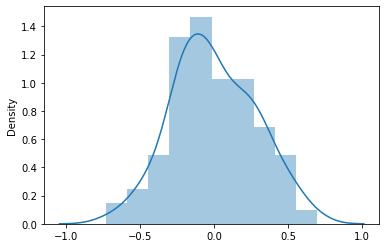

In [87]:
# Checking if the errors on the train set are normally distributed
y_train_pred = lm2.predict(X_train_rfe1)
res = y_train - y_train_pred
sns.distplot(res)
print("Train R Squared:",round(r2_score(y_train,y_train_pred),3))

#### Checking distributions of errors on test set

Test R Squared: 0.814


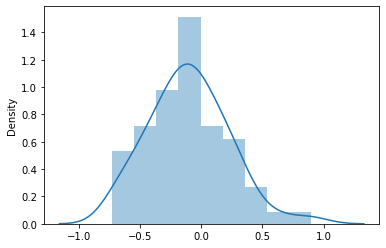

In [92]:
# adding a constant column
X_test["const"] = 1

# final feature list
features = ['const','enginelocation', 'carlength', 'carwidth', 'carheight',
       'enginesize', 'boreratio', 'horsepower', 'fwd', 'hardtop', 'hatchback',
       'sedan', 'wagon', 'ohcv', 'rotor', 'idi']

# reordering columns
X_test = X_test.reindex(features, axis=1)

# Checking if the errors on the test set are normally distributed
y_test_pred = lm2.predict(X_test)
res = y_test - y_test_pred
sns.distplot(res)

print("Test R Squared:",round(r2_score(y_test,y_test_pred),3))

Text(0, 0.5, 'y_pred')

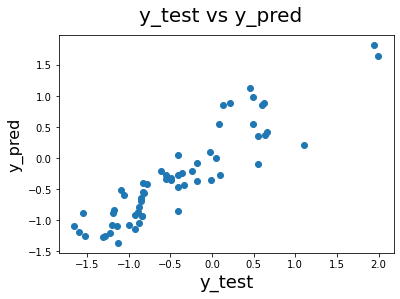

In [93]:
# Plotting y_test and y_pred to understand the spread
fig = plt.figure()
plt.scatter(y_test, y_test_pred)
fig.suptitle('y_test vs y_pred', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_pred', fontsize = 16)  

#### Checking the correlations between the final predictor variables

In [90]:
car_data_final = car_data[['enginelocation', 'carlength', 'carwidth', 'carheight',
       'enginesize', 'boreratio', 'horsepower', 'fwd', 'hardtop', 'hatchback',
       'sedan', 'wagon', 'ohcv', 'rotor', 'idi']]

<AxesSubplot:>

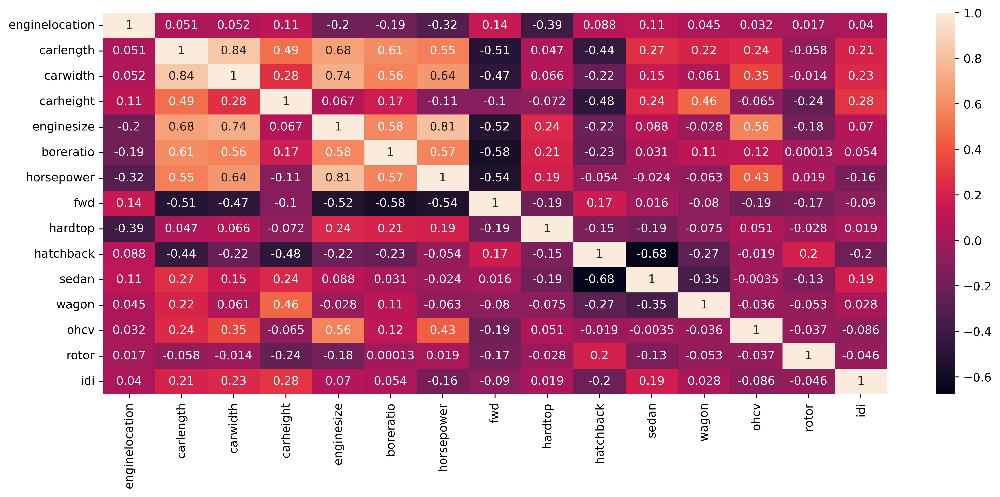

In [91]:
plt.figure(figsize = (15,6),dpi=500)
sns.heatmap(car_data_final.corr(),annot=True)